In [1]:
#Imoporting neccecory Libraries:

#common lib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

#preprocessing lib:
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder,LabelEncoder

#outliers lib:
from scipy import stats

#multicolliniarity lib:
from sklearn.feature_selection import SelectKBest,f_classif
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import train_test_split,cross_val_score

#Model building lib 
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier
from sklearn.svm import SVC

#model evaluation lib:
from sklearn.metrics import classification_report,roc_auc_score,accuracy_score,confusion_matrix,plot_roc_curve

#model hyper parameter tuning lib:
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

import warnings
warnings.filterwarnings('ignore')

In [3]:
#fetching the dataset info to dataframe
df=pd.read_csv('Micro_credit_file.csv')
df.head(10)

,Unnamed: 0,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,...,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
0,1,0,21408I70789,272.0,3055.050000,3065.150000,220.13,260.13,2.0,0.0,...,6.0,0.0,2.0,12,6,0.0,29.000000,29.000000,UPW,2016-07-20
1,2,1,76462I70374,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,0.0,...,12.0,0.0,1.0,12,12,0.0,0.000000,0.000000,UPW,2016-08-10
2,3,1,17943I70372,535.0,1398.000000,1398.000000,900.13,900.13,3.0,0.0,...,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,UPW,2016-08-19
3,4,1,55773I70781,241.0,21.228000,21.228000,159.42,159.42,41.0,0.0,...,6.0,0.0,2.0,12,6,0.0,0.000000,0.000000,UPW,2016-06-06
4,5,1,03813I82730,947.0,150.619333,150.619333,1098.90,1098.90,4.0,0.0,...,6.0,0.0,7.0,42,6,0.0,2.333333,2.333333,UPW,2016-06-22
5,6,1,35819I70783,568.0,2257.362667,2261.460000,368.13,380.13,2.0,0.0,...,6.0,0.0,3.0,18,6,0.0,11.000000,8.333333,UPW,2016-07-02
6,7,1,96759I84459,545.0,2876.641667,2883.970000,335.75,402.90,13.0,0.0,...,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,UPW,2016-07-05
7,8,1,09832I90846,768.0,12905.000000,17804.150000,900.35,2549.11,4.0,55.0,...,6.0,0.0,7.0,42,6,0.0,6.000000,3.857143,UPW,2016-08-05
8,9,1,59772I84450,1191.0,90.695000,90.695000,2287.50,2287.50,1.0,0.0,...,6.0,0.0,4.0,24,6,0.0,2.666667,2.666667,UPW,2016-06-15
9,10,1,56331I70783,536.0,29.357333,29.357333,612.96,612.96,11.0,0.0,...,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,UPW,2016-06-08


In [4]:
#display all the rows
pd.set_option('display.max_rows',None)

In [4]:
df.shape
#there is 209593 rows and 37 columns is availble in the data

(209593, 37)

In [5]:
df.info()
#the dataframe having the object,int and float datatypes

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209593 entries, 0 to 209592
Data columns (total 37 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Unnamed: 0            209593 non-null  int64  
 1   label                 209593 non-null  int64  
 2   msisdn                209593 non-null  object 
 3   aon                   209593 non-null  float64
 4   daily_decr30          209593 non-null  float64
 5   daily_decr90          209593 non-null  float64
 6   rental30              209593 non-null  float64
 7   rental90              209593 non-null  float64
 8   last_rech_date_ma     209593 non-null  float64
 9   last_rech_date_da     209593 non-null  float64
 10  last_rech_amt_ma      209593 non-null  int64  
 11  cnt_ma_rech30         209593 non-null  int64  
 12  fr_ma_rech30          209593 non-null  float64
 13  sumamnt_ma_rech30     209593 non-null  float64
 14  medianamnt_ma_rech30  209593 non-null  float64
 15  

In [6]:
#checking null value from the dataframe
df.isna().sum()

Unnamed: 0              0
label                   0
msisdn                  0
aon                     0
daily_decr30            0
daily_decr90            0
rental30                0
rental90                0
last_rech_date_ma       0
last_rech_date_da       0
last_rech_amt_ma        0
cnt_ma_rech30           0
fr_ma_rech30            0
sumamnt_ma_rech30       0
medianamnt_ma_rech30    0
medianmarechprebal30    0
cnt_ma_rech90           0
fr_ma_rech90            0
sumamnt_ma_rech90       0
medianamnt_ma_rech90    0
medianmarechprebal90    0
cnt_da_rech30           0
fr_da_rech30            0
cnt_da_rech90           0
fr_da_rech90            0
cnt_loans30             0
amnt_loans30            0
maxamnt_loans30         0
medianamnt_loans30      0
cnt_loans90             0
amnt_loans90            0
maxamnt_loans90         0
medianamnt_loans90      0
payback30               0
payback90               0
pcircle                 0
pdate                   0
dtype: int64

In [ ]:
#there is no null value in the data.checking the same with heatmap

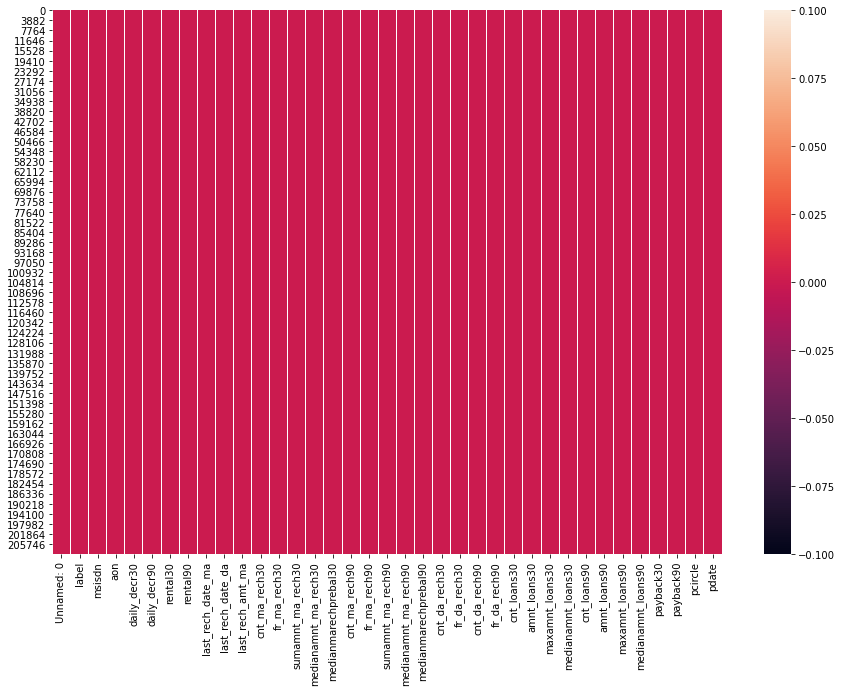

In [5]:
#plotting heatmap to check the null value
plt.figure(figsize=(15,10))
sns.heatmap(df.isna())
plt.show()

In [11]:
#checking value count
df['Unnamed: 0'].value_counts()

2047      1
41537     1
62027     1
64074     1
57929     1
59976     1
37447     1
39494     1
33349     1
35396     1
45635     1
47682     1
43584     1
49741     1
201271    1
203318    1
197173    1
199220    1
209459    1
205361    1
207408    1
152095    1
154142    1
147997    1
51788     1
55886     1
125288    1
29275     1
98917     1
100964    1
111203    1
113250    1
107105    1
109152    1
21087     1
23134     1
16989     1
19036     1
31322     1
53839     1
25177     1
27224     1
4695      1
6742      1
597       1
2644      1
12883     1
14930     1
8785      1
10832     1
150044    1
160283    1
162330    1
65909     1
86399     1
88446     1
82301     1
84348     1
94587     1
96634     1
90489     1
92536     1
70007     1
72054     1
67956     1
156185    1
78195     1
80242     1
74097     1
76144     1
119151    1
121198    1
115053    1
117100    1
127339    1
129386    1
174592    1
172545    1
178690    1
176643    1
158232    1
135703    1
137750    1
1316

In [5]:
#Unnamed: 0 is unwanted column so dropping the column.
df=df.drop(columns='Unnamed: 0',axis=1)

In [6]:
#fetching the numeric value from the dataframe
df._get_numeric_data().columns

Index(['label', 'aon', 'daily_decr30', 'daily_decr90', 'rental30', 'rental90',
       'last_rech_date_ma', 'last_rech_date_da', 'last_rech_amt_ma',
       'cnt_ma_rech30', 'fr_ma_rech30', 'sumamnt_ma_rech30',
       'medianamnt_ma_rech30', 'medianmarechprebal30', 'cnt_ma_rech90',
       'fr_ma_rech90', 'sumamnt_ma_rech90', 'medianamnt_ma_rech90',
       'medianmarechprebal90', 'cnt_da_rech30', 'fr_da_rech30',
       'cnt_da_rech90', 'fr_da_rech90', 'cnt_loans30', 'amnt_loans30',
       'maxamnt_loans30', 'medianamnt_loans30', 'cnt_loans90', 'amnt_loans90',
       'maxamnt_loans90', 'medianamnt_loans90', 'payback30', 'payback90'],
      dtype='object')

In [7]:
#label
df['cnt_ma_rech90'].value_counts()

1      27898
2      24052
0      20950
3      20446
4      17329
5      14830
6      12428
7      10466
8       8819
9       7465
10      6317
11      5332
12      4662
13      3844
14      3399
15      2833
16      2382
17      1986
18      1805
19      1570
20      1334
21      1128
22      1016
23       814
24       750
25       631
26       550
27       510
28       453
29       379
30       357
31       286
32       284
33       233
35       199
34       198
37       143
39       137
36       136
38       130
40       110
41        87
42        85
43        70
46        65
45        63
44        54
49        47
48        42
47        38
51        35
50        35
54        30
52        25
55        22
56        21
53        20
63        19
57        18
58        16
59        16
61        13
60        13
70         9
64         9
65         9
67         9
68         9
62         8
74         8
69         8
72         7
80         7
71         6
81         6
66         6
82         6

In [8]:
#fetching the column having data type object
df.select_dtypes(include=['object']).columns

Index(['msisdn', 'pcircle', 'pdate'], dtype='object')

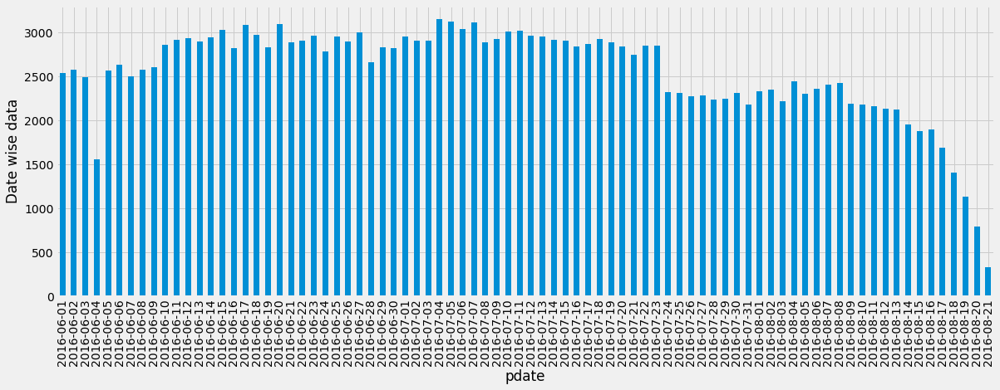

In [10]:
#plotting the graph for the date wise data
plt.style.use('fivethirtyeight')
fig=plt.figure(figsize=(18,6))
ax=df.groupby('pdate').label.count().plot.bar(ylim=0)
ax.set_ylabel('Date wise data')
plt.show()

In [13]:
#checking the value count for catagorical data msisdn
df['msisdn'].value_counts()

04581I85330    7
47819I90840    7
30080I90588    6
43430I70786    6
42825I88688    6
67324I84453    6
55809I89238    6
71742I90843    6
94119I84456    6
22038I88658    6
87592I84456    6
60744I91197    6
29191I82738    6
43096I88688    6
59873I88689    5
54218I70377    5
38553I70787    5
61990I84451    5
12125I88650    5
51545I85329    5
34362I70785    5
25840I70786    5
37897I89236    5
90144I85348    5
61951I88658    5
14389I70786    5
80215I90584    5
94646I84456    5
10002I88658    5
02304I95201    5
15458I85329    5
10535I90844    5
78109I96341    5
30832I85330    5
60476I84451    5
10996I70787    5
87267I70787    5
88560I95202    5
46895I84453    5
62395I89230    5
27674I84457    5
46484I84453    5
60650I85320    5
51097I70375    5
63085I90845    5
50700I90841    5
88892I70372    5
97649I82731    5
96740I70376    5
21926I88659    5
30487I89233    5
12730I89231    5
22744I88680    5
34525I90581    5
01339I70375    5
76939I82731    5
02306I82730    5
07747I90581    5
48516I70784   

In [14]:
#checking the value count for catagorical data pcircle
df['pcircle'].value_counts()

UPW    209593
Name: pcircle, dtype: int64

In [15]:
#feature msisdn,pcircle looks unwanted column which does not any impact on the target so dropping the column from the data frame.
df=df.drop(columns=['msisdn','pcircle'],axis=1)

In [16]:
#fetching the value count
df['pdate'].value_counts()

2016-07-04    3150
2016-07-05    3127
2016-07-07    3116
2016-06-20    3099
2016-06-17    3082
2016-07-06    3041
2016-06-15    3033
2016-07-11    3020
2016-07-10    3014
2016-06-27    2999
2016-06-18    2972
2016-06-23    2964
2016-07-12    2962
2016-06-25    2956
2016-07-01    2954
2016-07-13    2953
2016-06-14    2945
2016-06-12    2936
2016-07-18    2926
2016-07-09    2922
2016-07-14    2920
2016-06-11    2915
2016-07-02    2910
2016-07-15    2908
2016-06-22    2906
2016-07-03    2905
2016-06-26    2901
2016-06-13    2897
2016-07-19    2892
2016-07-08    2891
2016-06-21    2890
2016-07-17    2873
2016-06-10    2858
2016-07-23    2852
2016-07-22    2847
2016-07-20    2842
2016-07-16    2839
2016-06-19    2833
2016-06-29    2832
2016-06-16    2824
2016-06-30    2822
2016-06-24    2785
2016-07-21    2750
2016-06-28    2664
2016-06-06    2631
2016-06-09    2604
2016-06-08    2580
2016-06-02    2577
2016-06-05    2564
2016-06-01    2535
2016-06-07    2502
2016-06-03    2489
2016-08-04  

In [ ]:
#using to_datetime to convert object data type to the datetime dtype.

In [8]:
#seprating the day data
df['p_day']=pd.to_datetime(df.pdate,format="%Y-%m-%d").dt.day

#seprating the month data
df['p_month']=pd.to_datetime(df.pdate,format='%Y-%m-%d').dt.month

In [9]:
#dropping the column pdate as it is already converted into numerical data.
df=df.drop(columns='pdate',axis=1)

In [32]:
df.head()

,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,...,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,p_day,p_month
0,0,272.0,3055.050000,3065.150000,220.13,260.13,2.0,0.0,1539,2,...,6.0,0.0,2.0,12,6,0.0,29.000000,29.000000,20,7
1,1,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,0.0,5787,1,...,12.0,0.0,1.0,12,12,0.0,0.000000,0.000000,10,8
2,1,535.0,1398.000000,1398.000000,900.13,900.13,3.0,0.0,1539,1,...,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,19,8
3,1,241.0,21.228000,21.228000,159.42,159.42,41.0,0.0,947,0,...,6.0,0.0,2.0,12,6,0.0,0.000000,0.000000,6,6
4,1,947.0,150.619333,150.619333,1098.90,1098.90,4.0,0.0,2309,7,...,6.0,0.0,7.0,42,6,0.0,2.333333,2.333333,22,6


In [33]:
df._get_numeric_data().columns

Index(['label', 'aon', 'daily_decr30', 'daily_decr90', 'rental30', 'rental90',
       'last_rech_date_ma', 'last_rech_date_da', 'last_rech_amt_ma',
       'cnt_ma_rech30', 'fr_ma_rech30', 'sumamnt_ma_rech30',
       'medianamnt_ma_rech30', 'medianmarechprebal30', 'cnt_ma_rech90',
       'fr_ma_rech90', 'sumamnt_ma_rech90', 'medianamnt_ma_rech90',
       'medianmarechprebal90', 'cnt_da_rech30', 'fr_da_rech30',
       'cnt_da_rech90', 'fr_da_rech90', 'cnt_loans30', 'amnt_loans30',
       'maxamnt_loans30', 'medianamnt_loans30', 'cnt_loans90', 'amnt_loans90',
       'maxamnt_loans90', 'medianamnt_loans90', 'payback30', 'payback90',
       'p_day', 'p_month'],
      dtype='object')

In [34]:
df.select_dtypes(include=['object']).columns
#there is no object data left.

Index([], dtype='object')

In [53]:
#having 0 daily_decr30,rental30,rental90,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30
#last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,cnt_ma_rech30,cnt_ma_rech90
df['payback90'].value_counts()

0.000000      95699
2.000000       4982
3.000000       4437
4.000000       3610
2.500000       3015
1.500000       2917
5.000000       2716
3.500000       2522
1.000000       2055
6.000000       2033
4.500000       1797
7.000000       1562
2.333333       1540
5.500000       1467
2.666667       1449
3.333333       1309
1.666667       1265
8.000000       1253
3.666667       1124
6.500000       1109
9.000000        981
4.333333        952
1.333333        912
4.666667        846
2.250000        845
2.750000        834
7.500000        827
10.000000       806
8.500000        747
3.250000        736
5.333333        721
11.000000       704
3.750000        678
1.750000        672
5.666667        660
12.000000       619
9.500000        596
4.250000        584
6.666667        558
6.333333        547
2.200000        540
2.400000        519
13.000000       512
4.750000        502
10.500000       493
2.600000        489
3.200000        486
2.800000        482
3.600000        443
3.400000        442


In [54]:
#describe the data set
df.describe()

,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,...,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,p_day,p_month
count,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,...,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.00000,209593.000000
mean,0.875177,8112.343445,5381.402289,6082.515068,2692.581910,3483.406534,3755.847800,3712.202921,2064.452797,3.978057,...,274.658747,0.054029,18.520919,23.645398,6.703134,0.046077,3.398826,4.321485,14.39894,6.797321
std,0.330519,75696.082531,9220.623400,10918.812767,4308.586781,5770.461279,53905.892230,53374.833430,2370.786034,4.256090,...,4245.264648,0.218039,224.797423,26.469861,2.103864,0.200692,8.813729,10.308108,8.43890,0.741435
min,0.000000,-48.000000,-93.012667,-93.012667,-23737.140000,-24720.580000,-29.000000,-29.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.00000,6.000000
25%,1.000000,246.000000,42.440000,42.692000,280.420000,300.260000,1.000000,0.000000,770.000000,1.000000,...,6.000000,0.000000,1.000000,6.000000,6.000000,0.000000,0.000000,0.000000,7.00000,6.000000
50%,1.000000,527.000000,1469.175667,1500.000000,1083.570000,1334.000000,3.000000,0.000000,1539.000000,3.000000,...,6.000000,0.000000,2.000000,12.000000,6.000000,0.000000,0.000000,1.666667,14.00000,7.000000
75%,1.000000,982.000000,7244.000000,7802.790000,3356.940000,4201.790000,7.000000,0.000000,2309.000000,5.000000,...,6.000000,0.000000,5.000000,30.000000,6.000000,0.000000,3.750000,4.500000,21.00000,7.000000
max,1.000000,999860.755168,265926.000000,320630.000000,198926.110000,200148.110000,998650.377733,999171.809410,55000.000000,203.000000,...,99864.560864,3.000000,4997.517944,438.000000,12.000000,3.000000,171.500000,171.500000,31.00000,8.000000


In [ ]:
#As mean and median(50%) shows loots of diffrence so there is outliers available in features.
#The standerd daviation is not looks normal.

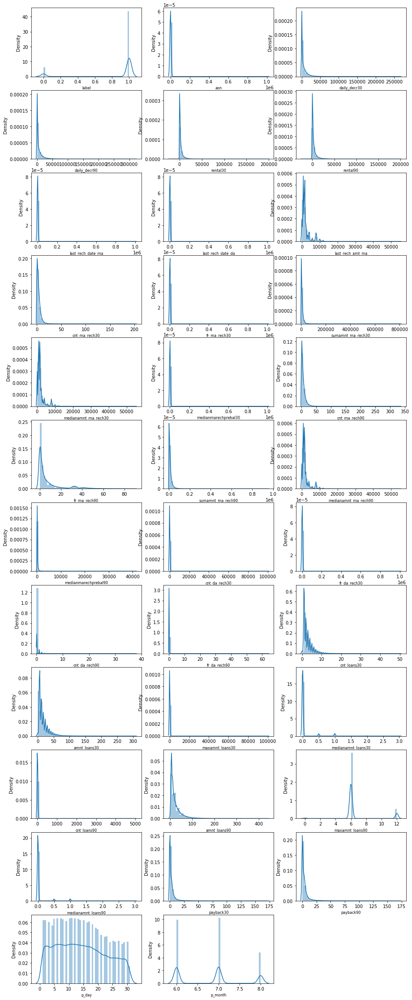

In [60]:
#ploting the distribition plot to check the data distribution
plt.figure(figsize=(15,40),facecolor='white')
pltnum=1

for column in df:
    if pltnum <= 36:
        plt.subplot(12,3,pltnum)
        sns.distplot(df[column])
        plt.xlabel(column,fontsize=8)
        
    pltnum +=1
plt.show()    

In [14]:
#there is lots of zero in the each features of dataset so replacing the zero values with the mean values of features.
df['aon']=df['aon'].replace(0,df['aon'].mean())
df['daily_decr30']=df['daily_decr30'].replace(0,df['daily_decr30'].mean())
df['daily_decr90']=df['daily_decr90'].replace(0,df['daily_decr90'].mean())
df['rental30']=df['rental30'].replace(0,df['rental30'].mean())
df['rental90']=df['rental90'].replace(0,df['rental90'].mean())
df['last_rech_date_ma']=df['last_rech_date_ma'].replace(0,df['last_rech_date_ma'].mean())
df['last_rech_date_da']=df['last_rech_date_da'].replace(0,df['last_rech_date_da'].mean())
df['last_rech_amt_ma']=df['last_rech_amt_ma'].replace(0,df['last_rech_amt_ma'].mean())
df['cnt_ma_rech30']=df['cnt_ma_rech30'].replace(0,df['cnt_ma_rech30'].mean())

df['fr_ma_rech30']=df['fr_ma_rech30'].replace(0,df['fr_ma_rech30'].mean())
df['sumamnt_ma_rech30']=df['sumamnt_ma_rech30'].replace(0,df['sumamnt_ma_rech30'].mean())
df['medianamnt_ma_rech30']=df['medianamnt_ma_rech30'].replace(0,df['medianamnt_ma_rech30'].mean())
df['medianmarechprebal30']=df['medianmarechprebal30'].replace(0,df['medianmarechprebal30'].mean())
df['fr_ma_rech90']=df['fr_ma_rech90'].replace(0,df['fr_ma_rech90'].mean())
df['sumamnt_ma_rech90']=df['sumamnt_ma_rech90'].replace(0,df['sumamnt_ma_rech90'].mean())
df['medianamnt_ma_rech90']=df['medianamnt_ma_rech90'].replace(0,df['medianamnt_ma_rech90'].mean())
df['medianmarechprebal90']=df['medianmarechprebal90'].replace(0,df['medianmarechprebal90'].mean())
df['cnt_da_rech30']=df['cnt_da_rech30'].replace(0,df['cnt_da_rech30'].mean())
df['fr_da_rech30']=df['fr_da_rech30'].replace(0,df['fr_da_rech30'].mean())
df['fr_da_rech90']=df['fr_da_rech90'].replace(0,df['fr_da_rech90'].mean())
df['cnt_loans30']=df['cnt_loans30'].replace(0,df['cnt_loans30'].mean())
df['amnt_loans30']=df['amnt_loans30'].replace(0,df['amnt_loans30'].mean())
df['maxamnt_loans30']=df['maxamnt_loans30'].replace(0,df['maxamnt_loans30'].mean())

df['medianamnt_loans30']=df['medianamnt_loans30'].replace(0,df['medianamnt_loans30'].mean())
df['cnt_loans90']=df['cnt_loans90'].replace(0,df['cnt_loans90'].mean())
df['amnt_loans90']=df['amnt_loans90'].replace(0,df['amnt_loans90'].mean())
df['maxamnt_loans90']=df['maxamnt_loans90'].replace(0,df['maxamnt_loans90'].mean())
df['medianamnt_loans90']=df['medianamnt_loans90'].replace(0,df['medianamnt_loans90'].mean())
df['payback30']=df['payback30'].replace(0,df['payback30'].mean())
df['payback90']=df['payback90'].replace(0,df['payback90'].mean())

In [76]:
#describe the dataframe
df.describe()

,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,...,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,p_day,p_month
count,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,...,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.00000,209593.000000
mean,0.875177,8112.343445,5487.801506,6200.425774,2789.780169,3598.382733,4127.556545,7305.172136,2271.249715,4.509097,...,278.909810,0.104410,18.700833,23.875881,6.768473,0.089480,5.129302,6.294651,14.39894,6.797321
std,0.330519,75696.082531,9188.906100,10885.282365,4277.003271,5734.500242,53891.659475,53128.386573,2269.567522,3.964818,...,4245.124999,0.205622,224.789939,26.365708,1.995996,0.190771,8.294916,9.686931,8.43890,0.741435
min,0.000000,-48.000000,-93.012667,-93.012667,-23737.140000,-24720.580000,-29.000000,-29.000000,173.000000,1.000000,...,6.000000,0.054029,1.000000,6.000000,6.000000,0.046077,1.000000,1.000000,1.00000,6.000000
25%,1.000000,246.000000,49.959000,50.031000,352.580000,391.500000,2.000000,3712.202921,773.000000,2.000000,...,6.000000,0.054029,1.000000,6.000000,6.000000,0.046077,3.398826,3.882353,7.00000,6.000000
50%,1.000000,527.000000,1743.530000,1781.000000,1270.800000,1557.980000,4.000000,3712.202921,1539.000000,3.978057,...,6.000000,0.054029,2.000000,12.000000,6.000000,0.046077,3.398826,4.321485,14.00000,7.000000
75%,1.000000,982.000000,7244.000000,7802.790000,3356.940000,4201.790000,11.000000,3712.202921,2309.000000,5.000000,...,6.000000,0.054029,5.000000,30.000000,6.000000,0.046077,3.750000,4.500000,21.00000,7.000000
max,1.000000,999860.755168,265926.000000,320630.000000,198926.110000,200148.110000,998650.377733,999171.809410,55000.000000,203.000000,...,99864.560864,3.000000,4997.517944,438.000000,12.000000,3.000000,171.500000,171.500000,31.00000,8.000000


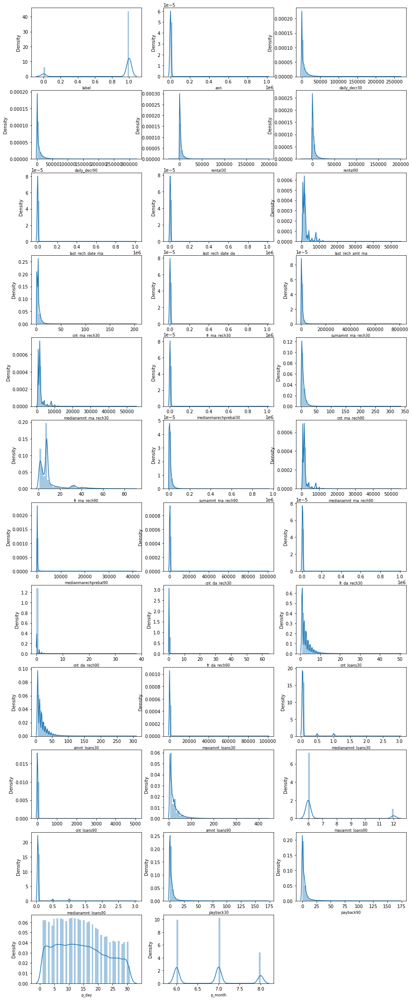

In [73]:
#ploting the distribition plot to check the data distribution
plt.figure(figsize=(15,40),facecolor='white')
pltnum=1

for column in df:
    if pltnum <= 36:
        plt.subplot(12,3,pltnum)
        sns.distplot(df[column])
        plt.xlabel(column,fontsize=8)
        
    pltnum +=1
plt.show()    

In [ ]:
#As we can see there are outliers available for all the feaures.
#checking the outliers again with the box plot.

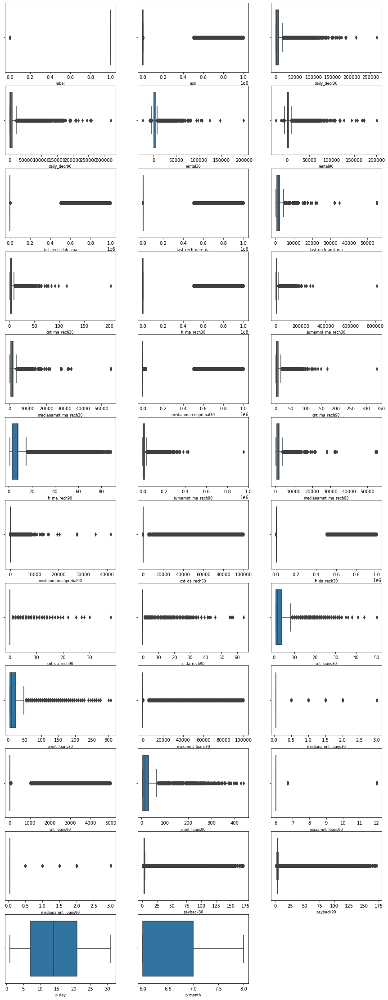

In [77]:
#ploting the distribition plot to check the data distribution
plt.figure(figsize=(15,40),facecolor='white')
pltnum=1

for column in df:
    if pltnum <= 36:
        plt.subplot(12,3,pltnum)
        sns.boxplot(df[column])
        plt.xlabel(column,fontsize=8)
        
    pltnum +=1
plt.show()    

In [ ]:
#there is outlier present in the every features as seen using the boxplot.
#using the IQR method to check the remove the outliers.

In [122]:
#using the z-score to check the outliers from the features
#z=np.abs(stats.zscore(df.iloc[:,1:]))

#getting the index 
#index=np.where(z > 3)[0]

In [17]:
#len(index)

In [15]:
#using the iqr method to get the outliers details:
q1=df.iloc[:,1:33].quantile(0.25)

q3=df.iloc[:,1:33].quantile(0.75)

iqr=q3-q1

In [16]:
for column in df.iloc[:,1:33]:
    index1=np.where(df[column] > (q3[column] +(1.5 * iqr[column])))

In [17]:
#dropping the outliers from the data frame
df=df.drop(df.index[index1])

In [18]:
#new shape
df.shape

(166459, 35)

In [19]:
#209593
#Data Loss
loss_percentage=(209593-166459)/209593*100
print(loss_percentage)

20.579885778628103


In [20]:
#checking the skewness and the features and target relation
df_corr=df.iloc[:,:33].abs().corr()
df_corr['label'].sort_values(ascending=False)

label                   1.000000
cnt_ma_rech90           0.252583
amnt_loans30            0.221649
cnt_loans30             0.220638
amnt_loans90            0.213884
cnt_ma_rech30           0.159927
sumamnt_ma_rech90       0.156057
daily_decr30            0.146759
daily_decr90            0.144762
sumamnt_ma_rech30       0.141643
maxamnt_loans90         0.118195
last_rech_amt_ma        0.061571
medianamnt_ma_rech30    0.058273
medianamnt_loans30      0.049948
medianamnt_ma_rech90    0.048563
rental90                0.046369
medianamnt_loans90      0.043951
rental30                0.029162
medianmarechprebal90    0.018074
cnt_da_rech90           0.007552
cnt_loans90             0.006052
cnt_da_rech30           0.003875
fr_da_rech30            0.000663
last_rech_date_da       0.000519
maxamnt_loans30         0.000516
fr_ma_rech90           -0.001004
fr_da_rech90           -0.001314
aon                    -0.003503
last_rech_date_ma      -0.003611
fr_ma_rech30           -0.009735
medianmare

In [ ]:
#there is no skewness in the features as the range is in between -0.5 to +0.5.

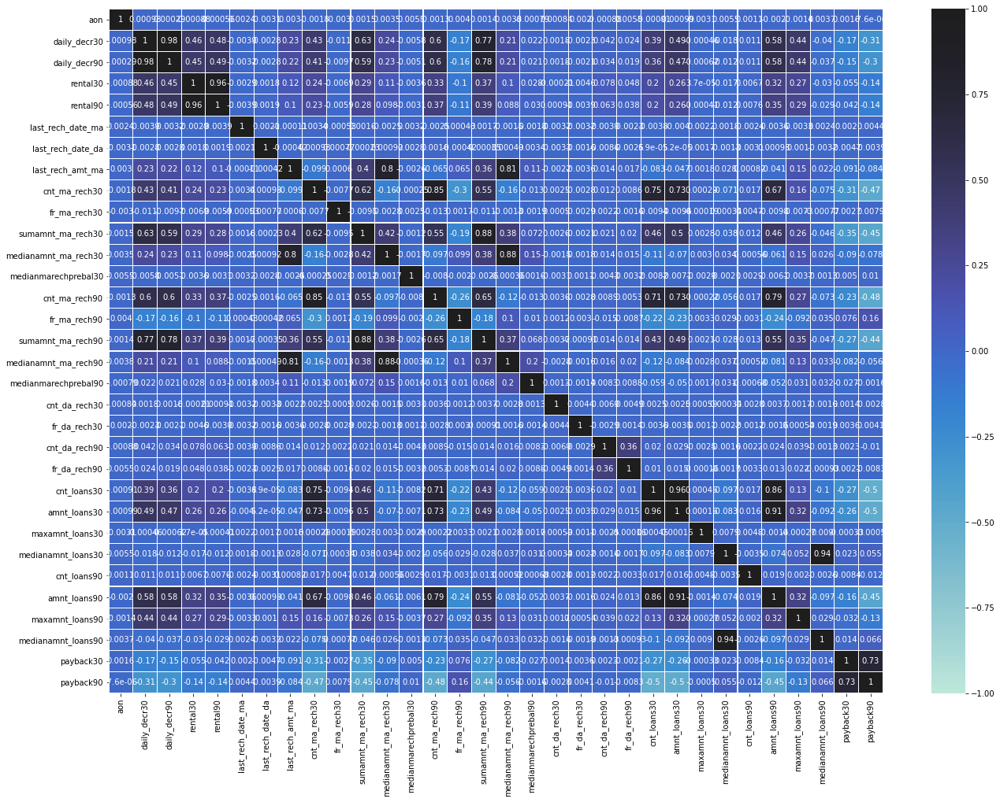

In [94]:
#using the heatmap to check the correlation between features.
corr_matrix=df.iloc[:,1:33].abs().corr()

plt.figure(figsize=(22,16))

sns.heatmap(corr_matrix,vmin=-1,vmax=1,center=True,annot=True, fmt='.2g',linewidths=0.1)
plt.show()

In [ ]:
#there is multicolliniarity issue looks in the multiple features having multicolliniarity issue.
#Checking the same with the variance inflection factor.

In [21]:
df1=df

In [22]:
scalar=StandardScaler()
x_data=scalar.fit_transform(df.iloc[:,1:])

In [23]:
df.iloc[:,1:]=x_data

In [24]:
df.head()

,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,...,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,p_day,p_month
1,1,-0.097042,0.708366,0.532815,0.265236,0.067068,-0.078585,-0.068219,1.444807,-0.868870,...,-0.063100,-0.243047,-0.078579,-0.405601,2.635283,-0.232644,0.166378,0.560657,-0.507180,1.710160
2,1,-0.099400,-0.414960,-0.412415,-0.414942,-0.442822,-0.078898,-0.068219,-0.350493,-0.868870,...,-0.064511,-0.243047,-0.078579,-0.615169,-0.383763,-0.232644,0.166378,0.560657,0.565942,1.710160
3,1,-0.103316,-0.559175,-0.533735,-0.595447,-0.578136,-0.078199,-0.068219,-0.600686,-0.165281,...,-0.064511,-0.243047,-0.074125,-0.405601,-0.383763,-0.232644,0.166378,0.560657,-0.984123,-0.992683
4,1,-0.093912,-0.545622,-0.522333,-0.366503,-0.406510,-0.078879,-0.068219,-0.025074,0.548676,...,-0.064511,-0.243047,-0.051852,0.642234,-0.383763,-0.232644,-1.056639,-1.457825,0.923649,-0.992683
6,1,-0.099267,-0.260074,-0.281473,-0.552477,-0.533657,-0.078714,-0.068219,1.444807,-0.868870,...,-0.064511,-0.243047,-0.078579,-0.615169,-0.383763,-0.232644,0.166378,0.560657,-1.103358,0.358739


In [25]:
x_tst=df.iloc[:,1:]

In [26]:
#checking feature colliniarity using VIF
vif=pd.DataFrame()
vif['features']=x_tst.columns
vif['vif score']=[variance_inflation_factor(x_data,i) for i in range(x_data.shape[1])]
vif

,features,vif score
0,aon,1.000250
1,daily_decr30,30.356456
2,daily_decr90,33.329553
3,rental30,13.889932
4,rental90,14.889264
5,last_rech_date_ma,1.000431
6,last_rech_date_da,1.000275
7,last_rech_amt_ma,3.378381
8,cnt_ma_rech30,8.753988
9,fr_ma_rech30,1.000559


In [27]:
#from the vif we can see there is multicolliniarity issue between multiple features as max of features having vif score greater than 5:
#(daily_decr30,daily_decr90),(rental30,rental90),(sumamnt_ma_rech30,medianamnt_ma_rech30),(sumamnt_ma_rech90,medianamnt_ma_rech90)

In [28]:
#dropping the columns which has multicolliniary issue(features having vif score greater than 5).
df=df.drop(columns=['daily_decr90','rental90','sumamnt_ma_rech30','sumamnt_ma_rech90','amnt_loans30','amnt_loans90','cnt_ma_rech30','cnt_ma_rech90','cnt_ma_rech90','medianamnt_loans30','medianamnt_ma_rech90'],axis=1)

In [29]:
df.head()

,label,aon,daily_decr30,rental30,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,fr_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,...,fr_da_rech90,cnt_loans30,maxamnt_loans30,cnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,p_day,p_month
1,1,-0.097042,0.708366,0.265236,-0.078585,-0.068219,1.444807,-0.029109,1.787797,-0.082538,...,-0.046149,-0.651638,-0.063100,-0.078579,2.635283,-0.232644,0.166378,0.560657,-0.507180,1.710160
2,1,-0.099400,-0.414960,-0.414942,-0.078898,-0.068219,-0.350493,-0.029109,-0.294335,-0.082439,...,-0.046149,-0.651638,-0.064511,-0.078579,-0.383763,-0.232644,0.166378,0.560657,0.565942,1.710160
3,1,-0.103316,-0.559175,-0.595447,-0.078199,-0.068219,-0.600686,-0.029109,-0.160125,-0.011621,...,-0.046149,-0.285692,-0.064511,-0.074125,-0.383763,-0.232644,0.166378,0.560657,-0.984123,-0.992683
4,1,-0.093912,-0.545622,-0.366503,-0.078879,-0.068219,-0.025074,-0.099334,0.083076,-0.083137,...,-0.046149,1.544038,-0.064511,-0.051852,-0.383763,-0.232644,-1.056639,-1.457825,0.923649,-0.992683
6,1,-0.099267,-0.260074,-0.552477,-0.078714,-0.068219,1.444807,-0.029109,1.787797,-0.078483,...,-0.046149,-0.651638,-0.064511,-0.078579,-0.383763,-0.232644,0.166378,0.560657,-1.103358,0.358739


In [30]:
scalar=StandardScaler()
x_data=scalar.fit_transform(df.iloc[:,1:])

In [31]:
df.iloc[:,1:]=x_data

In [32]:
x_tst=df.iloc[:,1:]

In [33]:
#checking feature colliniarity using VIF
vif=pd.DataFrame()
vif['features']=x_tst.columns
vif['vif score']=[variance_inflation_factor(x_data,i) for i in range(x_data.shape[1])]
vif

,features,vif score
0,aon,1.000176
1,daily_decr30,2.075667
2,rental30,1.337761
3,last_rech_date_ma,1.000138
4,last_rech_date_da,1.000214
5,last_rech_amt_ma,2.852470
6,fr_ma_rech30,1.000402
7,medianamnt_ma_rech30,2.978869
8,medianmarechprebal30,1.000286
9,fr_ma_rech90,1.082771


In [ ]:
#The multicolliniary issue has solved as vif score is less than 5 for all the features.

In [34]:
#seprating the features and target
x=df.drop(columns='label')
y=df['label']

In [35]:
#Checking the upsampling and downsampling(class imbalanced problem) for the target columns
df['label'].value_counts()

1    143445
0     23014
Name: label, dtype: int64

In [36]:
print(y.shape,x.shape)

(166459,) (166459, 24)


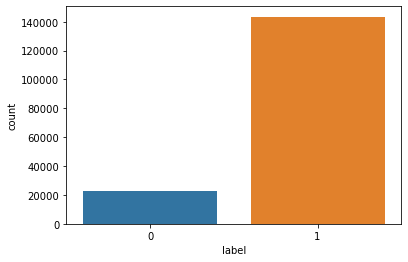

In [37]:
#Plotting the count plot to check label data
sns.countplot(x='label',data=df)
plt.show()

In [38]:
#here we can see the issue of class imbalanced problem as 0 has 143445 count and 1 has only 23014 count.

In [39]:
#handling class imbalanced problem by oversampling the minority class using SMOTE:
from imblearn.over_sampling import SMOTE

In [40]:
SM=SMOTE()
x_fit,y_fit=SM.fit_resample(x,y)

In [41]:
y_fit.value_counts()

1    143445
0    143445
Name: label, dtype: int64

In [ ]:
#the imbalanced problem has been resolved.

In [42]:
#Finding best Random State:
maxAcc=0
maxRs=0

for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(x_fit,y_fit,test_size=0.25,random_state=i)
    dt=LogisticRegression()
    dt.fit(x_train,y_train)
    y_pred=dt.predict(x_test)
    acc_s=accuracy_score(y_test,y_pred)
    if acc_s > maxAcc:
        maxAcc=acc_s
        maxRs=i
        
print(f"Best Accuracy is : {maxAcc* 100:.2f}%")
print("The Best Random State is :",maxRs)

Best Accuracy is : 75.83%
The Best Random State is : 73


In [43]:
#seprating the train and test datasets with the best find random state
x_train,x_test,y_train,y_test=train_test_split(x_fit,y_fit,test_size=0.25,random_state=73)

In [44]:
#Using the DecisionTreeClassifier algorithm to check the accuray score,DecisionTreeClassifier and Confusion Matrix:
lr=LogisticRegression()
lr.fit(x_train,y_train)
y_predlr=lr.predict(x_test)

print('\n==========Outputs of Logistics Reggression===========')

print('\n==========Accuracy Score===========')
print(f"Accuracy Score is : {accuracy_score(y_test,y_predlr)* 100:.2f}%\n")

print('======Classification Report=============')
print(classification_report(y_test,y_predlr,digits=2),'\n')

print('=========Confusion Matrix============')
print(confusion_matrix(y_test,y_predlr))


==========Outputs of Logistics Reggression===========

==========Accuracy Score===========
Accuracy Score is : 75.83%

======Classification Report=============
              precision    recall  f1-score   support

           0       0.71      0.88      0.78     35872
           1       0.84      0.64      0.72     35851

    accuracy                           0.76     71723
   macro avg       0.77      0.76      0.75     71723
weighted avg       0.77      0.76      0.75     71723
 

=========Confusion Matrix============
[[31554  4318]
 [13014 22837]]


In [45]:
#Using the DecisionTreeClassifier algorithm to check the accuray score,DecisionTreeClassifier and Confusion Matrix:
dt=DecisionTreeClassifier()
dt.fit(x_train,y_train)
y_preddt=dt.predict(x_test)

print('\n==========Outputs of DT===========')

print('\n==========Accuracy Score===========')
print(f"Accuracy Score is : {accuracy_score(y_test,y_preddt)* 100:.2f}%\n")

print('======Classification Report=============')
print(classification_report(y_test,y_preddt,digits=2),'\n')

print('=========Confusion Matrix============')
print(confusion_matrix(y_test,y_preddt))


==========Outputs of DT===========

==========Accuracy Score===========
Accuracy Score is : 90.71%

======Classification Report=============
              precision    recall  f1-score   support

           0       0.90      0.91      0.91     35872
           1       0.91      0.90      0.91     35851

    accuracy                           0.91     71723
   macro avg       0.91      0.91      0.91     71723
weighted avg       0.91      0.91      0.91     71723
 

=========Confusion Matrix============
[[32783  3089]
 [ 3577 32274]]


In [46]:
#Using the AdaBoostClassifier algorithm to check the accuray score,DecisionTreeClassifier and Confusion Matrix:
abc=AdaBoostClassifier()
abc.fit(x_train,y_train)
y_predabc=abc.predict(x_test)

print('\n==========Outputs of ADA Boost===========')

print('\n==========Accuracy Score===========')
print(f"Accuracy Score is : {accuracy_score(y_test,y_predabc)* 100:.2f}%\n")

print('======Classification Report=============')
print(classification_report(y_test,y_predabc,digits=2),'\n')

print('=========Confusion Matrix============')
print(confusion_matrix(y_test,y_predabc))


==========Outputs of ADA Boost===========

==========Accuracy Score===========
Accuracy Score is : 85.66%

======Classification Report=============
              precision    recall  f1-score   support

           0       0.84      0.88      0.86     35872
           1       0.88      0.83      0.85     35851

    accuracy                           0.86     71723
   macro avg       0.86      0.86      0.86     71723
weighted avg       0.86      0.86      0.86     71723
 

=========Confusion Matrix============
[[31645  4227]
 [ 6059 29792]]


In [47]:
#Using the RandomForestClassifier algorithm to check the accuray score,DecisionTreeClassifier and Confusion Matrix:

rfc=RandomForestClassifier()
rfc.fit(x_train,y_train)
y_predrfc=rfc.predict(x_test)

print('\n==========Outputs of Random Forest Classifier===========')

print('\n==========Accuracy Score===========')
print(f"Accuracy Score is : {accuracy_score(y_test,y_predrfc)* 100:.2f}%\n")

print('======Classification Report=============')
print(classification_report(y_test,y_predrfc,digits=2),'\n')

print('=========Confusion Matrix============')
print(confusion_matrix(y_test,y_predrfc))


==========Outputs of Random Forest Classifier===========

==========Accuracy Score===========
Accuracy Score is : 94.60%

======Classification Report=============
              precision    recall  f1-score   support

           0       0.94      0.95      0.95     35872
           1       0.95      0.94      0.95     35851

    accuracy                           0.95     71723
   macro avg       0.95      0.95      0.95     71723
weighted avg       0.95      0.95      0.95     71723
 

=========Confusion Matrix============
[[34107  1765]
 [ 2106 33745]]


In [48]:
#Using the KNeighborsClassifier algorithm to check the accuray score,DecisionTreeClassifier and Confusion Matrix:

knn=KNeighborsClassifier()
knn.fit(x_train,y_train)
y_predknn=knn.predict(x_test)

print('\n==========Outputs of KNeighborsClassifier===========')

print('\n==========Accuracy Score===========')
print(f"Accuracy Score is : {accuracy_score(y_test,y_predknn)* 100:.2f}%\n")

print('======Classification Report=============')
print(classification_report(y_test,y_predknn,digits=2),'\n')

print('=========Confusion Matrix============')
print(confusion_matrix(y_test,y_predknn))


==========Outputs of KNeighborsClassifier===========

==========Accuracy Score===========
Accuracy Score is : 88.18%

======Classification Report=============
              precision    recall  f1-score   support

           0       0.83      0.97      0.89     35872
           1       0.96      0.80      0.87     35851

    accuracy                           0.88     71723
   macro avg       0.89      0.88      0.88     71723
weighted avg       0.89      0.88      0.88     71723
 

=========Confusion Matrix============
[[34629  1243]
 [ 7237 28614]]


In [49]:
print('\n==========Cross Validation Score of Logistices Classifier===========')
cvs_lr=cross_val_score(lr,x_fit,y_fit,cv=5)
print(f"Cross validation for the Logistices Classifier is: {cvs_lr.mean()*100:.2f}%\n")

print('\n==========Cross Validation Score of Random Forest Classifier===========')
cvs_rfc=cross_val_score(rfc,x_fit,y_fit,cv=5)
print(f"Cross validation for the Random Forest Classifier is: {cvs_rfc.mean()*100:.2f}%\n")

print('\n=============Cross Validation Score of Decision Tree====================')
cvs_dt=cross_val_score(dt,x_fit,y_fit,cv=5)
print(f"Cross validation for the Decision Tree is: {cvs_dt.mean()*100:.2f}%\n")

print('\n=============Cross Validation Score of AdaBoost Classifier==============')
cvs_abc=cross_val_score(abc,x_fit,y_fit,cv=5)
print(f"Cross validation for the AdaBoost Classifier is: {cvs_abc.mean()*100:.2f}%\n")

print('\n===================Cross Validation Score of KNN========================')
cvs_knn=cross_val_score(knn,x_fit,y_fit,cv=5)
print(f"Cross validation for the KNN Classifier is: {cvs_knn.mean()*100:.2f}%\n")



==========Cross Validation Score of Logistices Classifier===========
Cross validation for the Logistices Classifier is: 75.39%


==========Cross Validation Score of Random Forest Classifier===========
Cross validation for the Random Forest Classifier is: 94.38%


=============Cross Validation Score of Decision Tree====================
Cross validation for the Decision Tree is: 90.56%


=============Cross Validation Score of AdaBoost Classifier==============
Cross validation for the AdaBoost Classifier is: 85.43%


===================Cross Validation Score of KNN========================
Cross validation for the KNN Classifier is: 88.42%



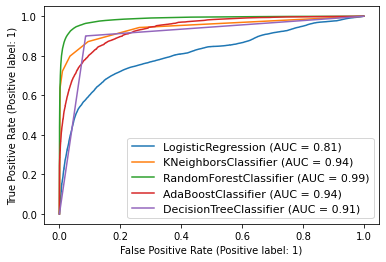

In [50]:
#plotting the ROC AUC Curve:
cross_cv=plot_roc_curve(lr,x_test,y_test)
plot_roc_curve(knn,x_test,y_test,ax=cross_cv.ax_)
plot_roc_curve(rfc,x_test,y_test,ax=cross_cv.ax_)
plot_roc_curve(abc,x_test,y_test,ax=cross_cv.ax_)
plot_roc_curve(dt,x_test,y_test,ax=cross_cv.ax_)

plt.legend(prop={'size':11},loc='lower right')
plt.show()

In [ ]:
#LR: Accuracy:75.83   cross validation score:75.39  Diffrence:0.44
#DT: Accuracy:90.71   cross validation score:90.56  Diffrence:0.15
#ADA: Accuracy:85.66   cross validation score:85.43  Diffrence:0.23
#RFC: Accuracy:94.60   cross validation score:94.38  Diffrence:0.22
#KNN: Accuracy:88.18   cross validation score:88.42  Diffrence:-0.24

#As we can see the Random Forest Regressor has highest accuracy and least differnece so we can select it for hyper parameter tuning.

In [54]:
#Now Appling the gridsearchcv beofore building the model to check the best parameter.
best_param={'n_estimators':[90,100],
           'criterion':['gini','entropy'],
           'max_depth':[10,12],
           'min_samples_split':[2,3],
           'min_samples_leaf':[2,4]}

In [55]:
gridcv=GridSearchCV(rfc,param_grid=best_param)

In [56]:
gridcv.fit(x_train,y_train) 

GridSearchCV(estimator=RandomForestClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [10, 12], 'min_samples_leaf': [2, 4],
                         'min_samples_split': [2, 3],
                         'n_estimators': [90, 100]})

In [57]:
gridcv.best_params_

{'criterion': 'gini',
 'max_depth': 12,
 'min_samples_leaf': 2,
 'min_samples_split': 3,
 'n_estimators': 100}

In [60]:
#Using the DecisionTreeClassifier algorithm to check the accuray score,DecisionTreeClassifier and Confusion Matrix:
rfc=RandomForestClassifier(criterion='entropy',max_depth=10,min_samples_leaf=3,min_samples_split=3,n_estimators=100)
rfc.fit(x_train,y_train)
y_predrfc=rfc.predict(x_test)

print('\n==========Outputs of Random Forest Classifier===========')

print('\n==========Accuracy Score===========')
print(f"Accuracy Score is : {accuracy_score(y_test,y_predrfc)* 100:.2f}%\n")

print('======Classification Report=============')
print(classification_report(y_test,y_predrfc,digits=2),'\n')

print('=========Confusion Matrix============')
print(confusion_matrix(y_test,y_predrfc))


==========Outputs of Random Forest Classifier===========

==========Accuracy Score===========
Accuracy Score is : 86.70%

======Classification Report=============
              precision    recall  f1-score   support

           0       0.84      0.90      0.87     35872
           1       0.90      0.83      0.86     35851

    accuracy                           0.87     71723
   macro avg       0.87      0.87      0.87     71723
weighted avg       0.87      0.87      0.87     71723
 

=========Confusion Matrix============
[[32436  3436]
 [ 6101 29750]]


In [ ]:
#the Hyper parameter tuning has not incressed the accurcy so use randomforest without hyper parameter tuning.

In [61]:
#Using the DecisionTreeClassifier algorithm to check the accuray score,DecisionTreeClassifier and Confusion Matrix:
rfc=RandomForestClassifier()
rfc.fit(x_train,y_train)
y_predrfc=rfc.predict(x_test)

print('\n==========Outputs of Random Forest Classifier===========')

print('\n==========Accuracy Score===========')
print(f"Accuracy Score is : {accuracy_score(y_test,y_predrfc)* 100:.2f}%\n")

print('======Classification Report=============')
print(classification_report(y_test,y_predrfc,digits=2),'\n')

print('=========Confusion Matrix============')
print(confusion_matrix(y_test,y_predrfc))


==========Outputs of Random Forest Classifier===========

==========Accuracy Score===========
Accuracy Score is : 94.58%

======Classification Report=============
              precision    recall  f1-score   support

           0       0.94      0.95      0.95     35872
           1       0.95      0.94      0.95     35851

    accuracy                           0.95     71723
   macro avg       0.95      0.95      0.95     71723
weighted avg       0.95      0.95      0.95     71723
 

=========Confusion Matrix============
[[34124  1748]
 [ 2138 33713]]


In [ ]:
#Saving RandomForestClassifier as our final model.

In [62]:
#importing the joblib to save the model
import joblib

In [63]:
joblib.dump(rfc,'Micro_Credit_Loan_Model.pkl')

['Micro_Credit_Loan_Model.pkl']

In [ ]:
#this complete the model buliding.